In [1]:
model_folder = '/content/drive/MyDrive/AAI_MODEL'

In [2]:
from tensorflow.keras.models import load_model
model = load_model('/content/drive/MyDrive/AAI_MODEL/model_name.h5')

In [3]:
model

<Functional name=functional, built=True>

In [4]:
import cv2
from tensorflow.keras.utils import img_to_array
import matplotlib.pyplot as plt

def preprocess(img_path, target_size=(224, 224)):
    image = cv2.imread(img_path)
    image = cv2.resize(image, target_size)
    image = image / 255.0
    return img_to_array(image)

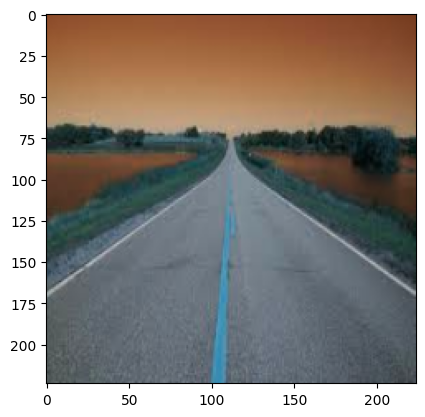

In [6]:
input_image = preprocess('/content/images.jpeg')
plt.imshow(input_image)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


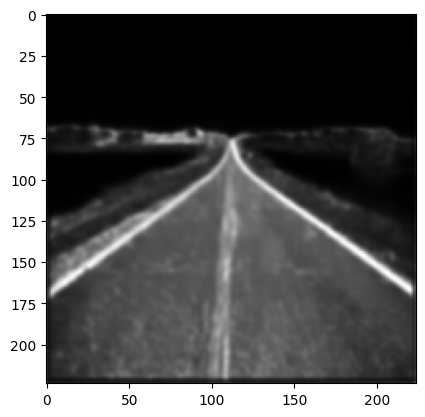

In [7]:
test_img = preprocess('/content/images.jpeg')
test_img = test_img.reshape(1, 224, 224, 3)
test_img = model.predict(test_img)
test_img = test_img[0, :, :, 0]
plt.imshow(test_img,cmap = 'gray')

In [8]:
test_img = test_img * 255

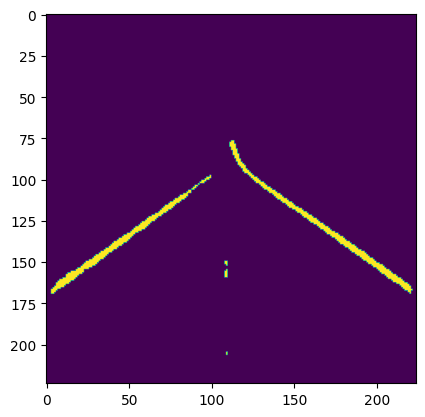

In [15]:
import numpy as np
_, mask = cv2.threshold(test_img, 75, 200, cv2.THRESH_BINARY)

# Convert the mask to a 3-channel image to match the original's shape
mask_colored = cv2.cvtColor(mask, cv2.COLOR_GRAY2BGR)

red_overlay = np.zeros_like(input_image)
red_overlay[:, :, 2] = mask
plt.imshow(mask)

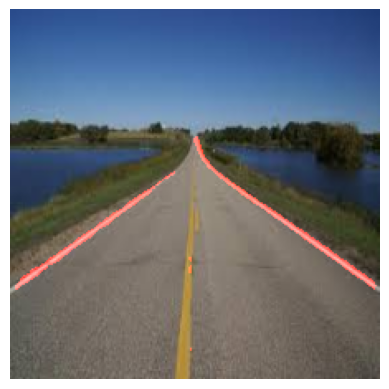

In [10]:
highlighted = cv2.addWeighted(input_image, 1, red_overlay, 0.5, 0)

plt.imshow(cv2.cvtColor(highlighted, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

In [5]:
def preprocess_image(image, target_size=(224, 224)):
    image = cv2.resize(image, target_size)
    image = image / 255.0
    return img_to_array(image)

In [8]:
import cv2
import numpy as np

# Input video path and output video path
input_video_path = "/content/vid.mp4"
output_video_path = "/content/output_vid.mp4"

# Initialize the video capture and get the properties of the input video
cap = cv2.VideoCapture(input_video_path)
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = cap.get(cv2.CAP_PROP_FPS)

# Define the codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Codec for .mp4 format
out = cv2.VideoWriter(output_video_path, fourcc, fps, (frame_width, frame_height))

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Preprocess and predict
    img = preprocess_image(frame)
    img = img.reshape(1, 224, 224, 3)
    pred_img = model.predict(img)

    # Process the prediction output
    pred_img = pred_img[0, :, :, 0] * 255  # Assume single-channel output from model
    pred_img = cv2.resize(pred_img, (frame.shape[1], frame.shape[0]))  # Resize to original frame size
    _, mask = cv2.threshold(pred_img.astype(np.uint8), 75, 200, cv2.THRESH_BINARY)

    # Create the red overlay and combine it with the frame
    red_overlay = np.zeros_like(frame)
    red_overlay[:, :, 2] = mask  # Set mask in the red channel
    highlighted = cv2.addWeighted(frame, 1, red_overlay, 0.5, 0)

    # Write the frame to the output video
    out.write(highlighted)

# Release resources
cap.release()
out.release()
cv2.destroyAllWindows()


1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


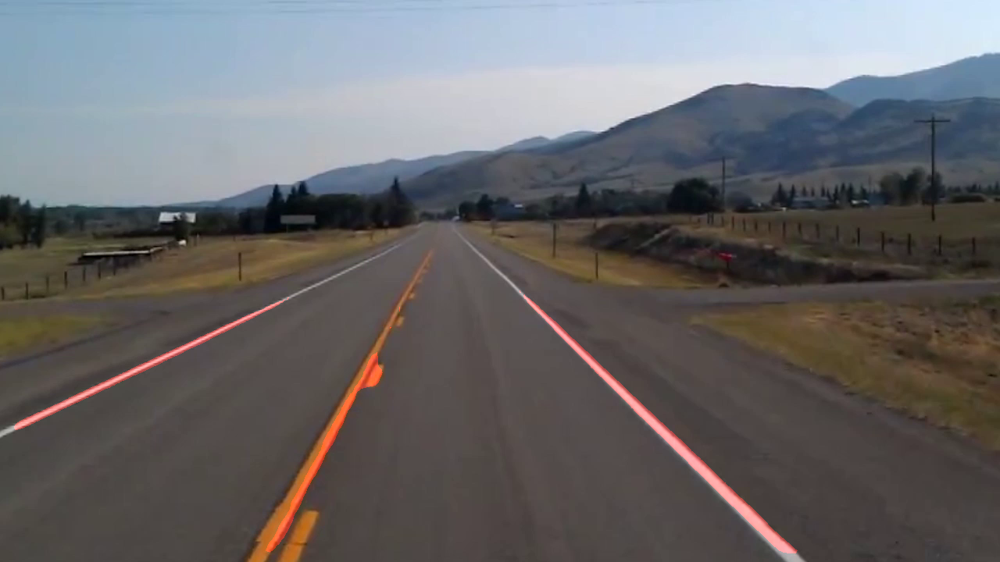

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


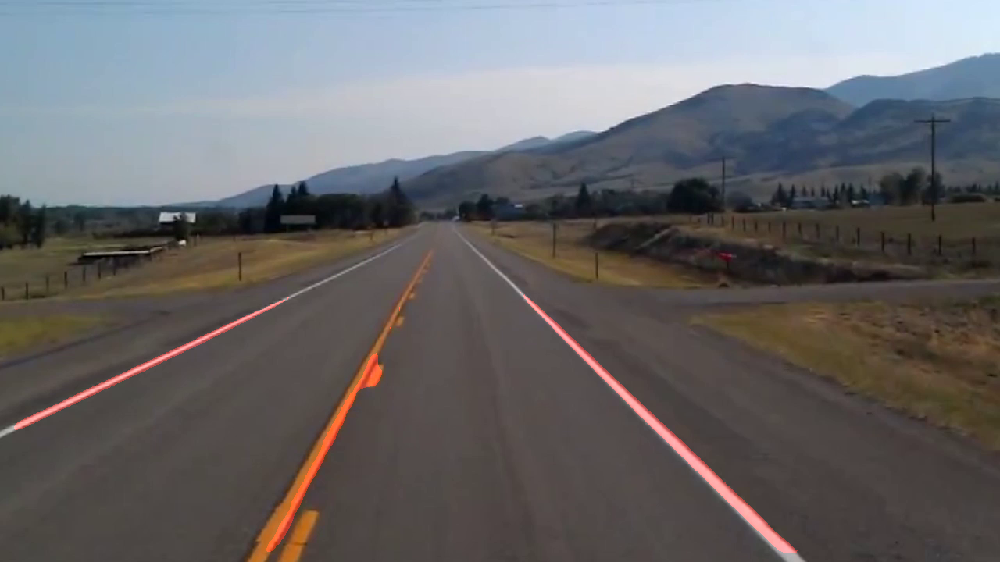

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


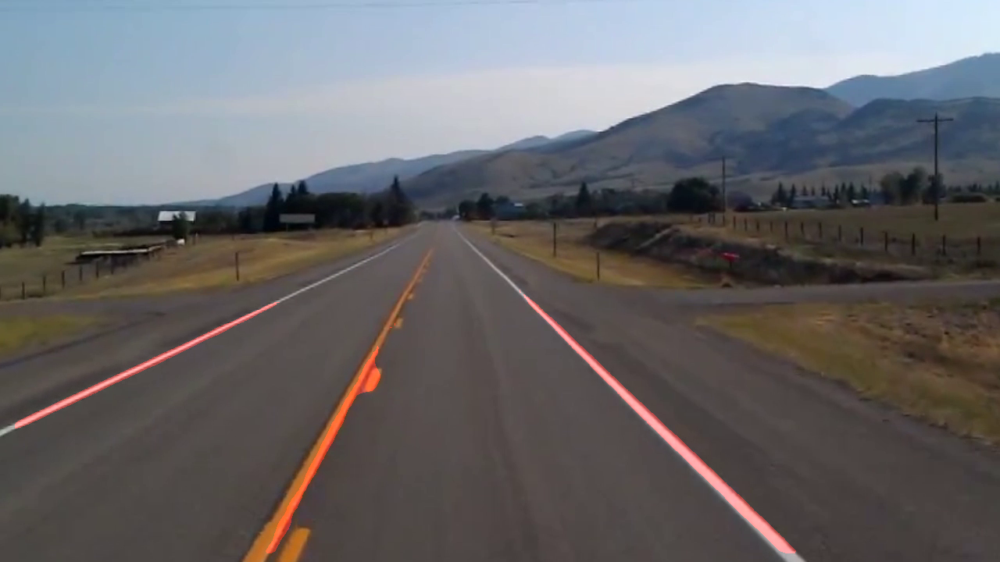

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


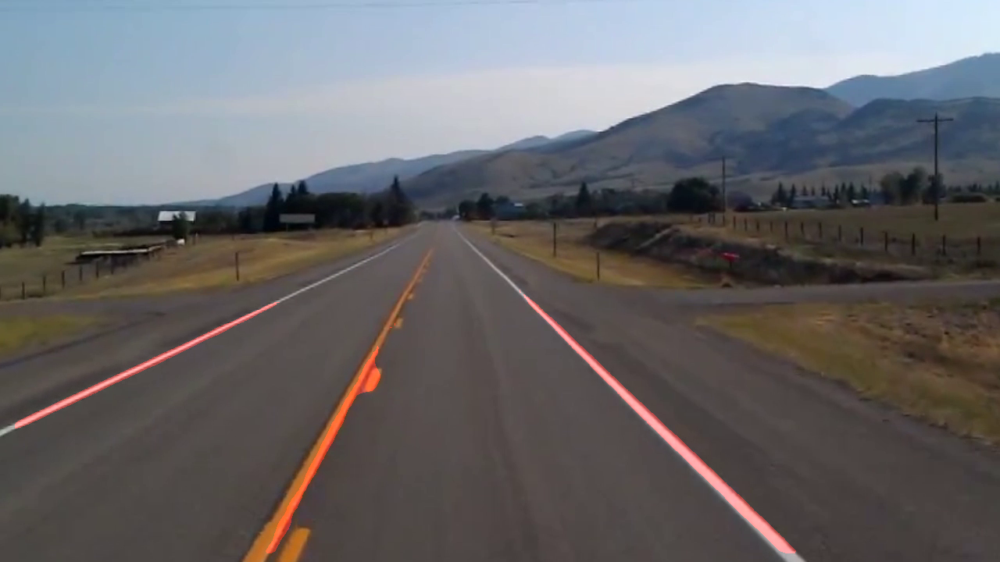

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


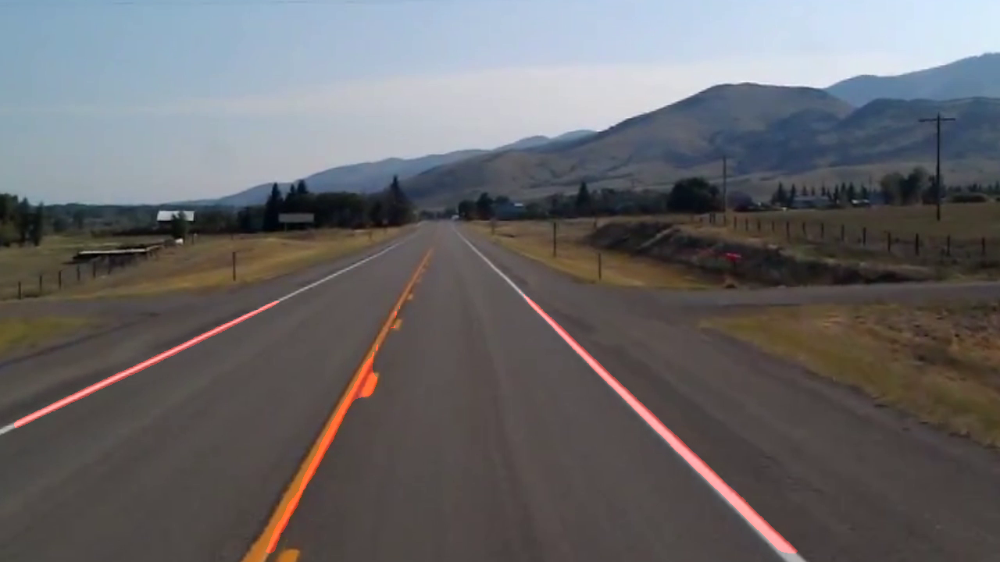

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


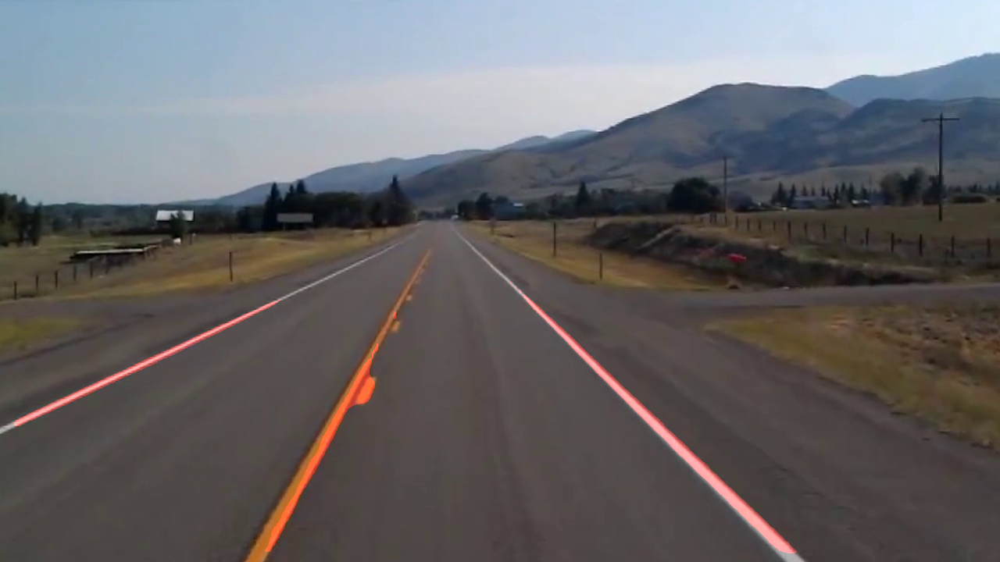

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


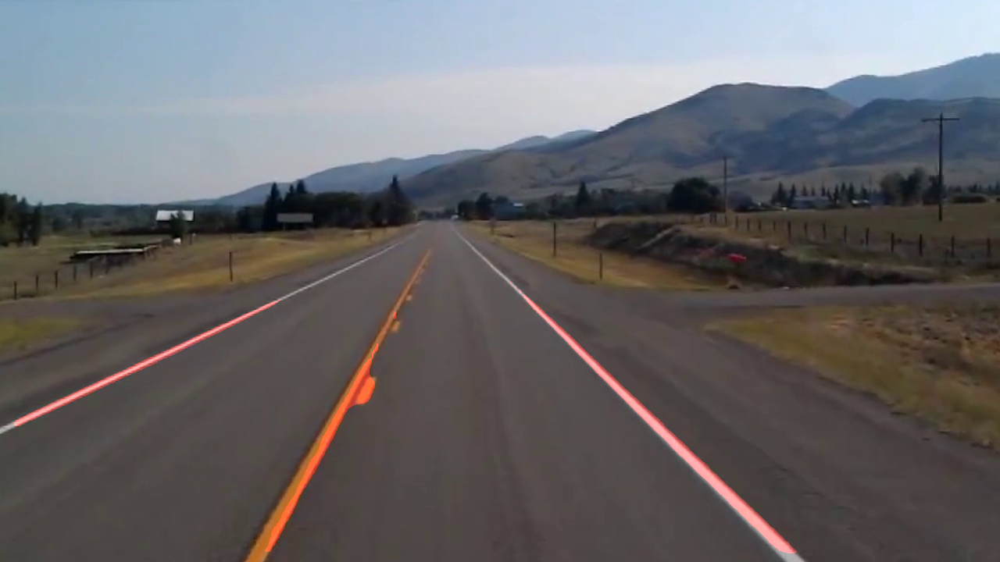

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


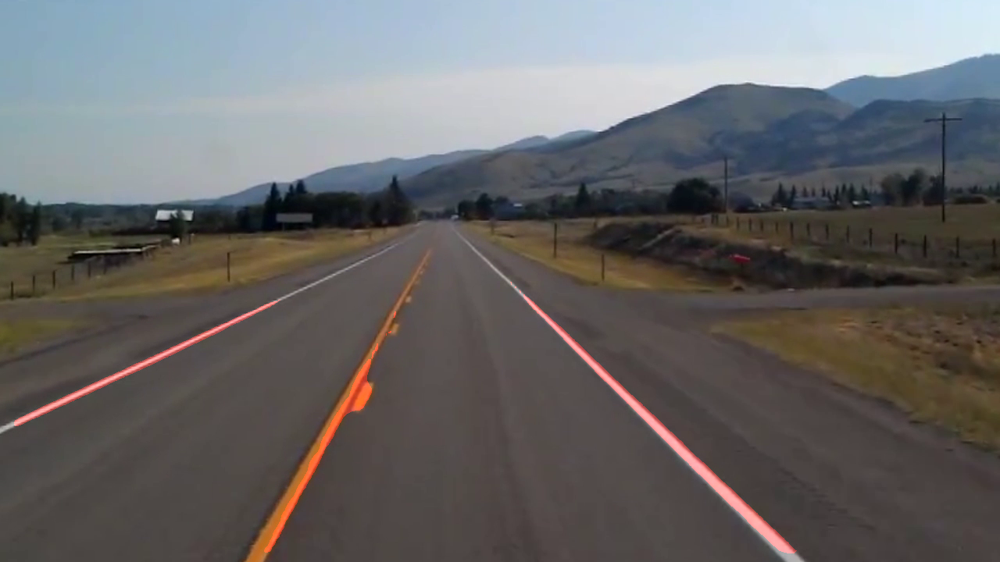

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


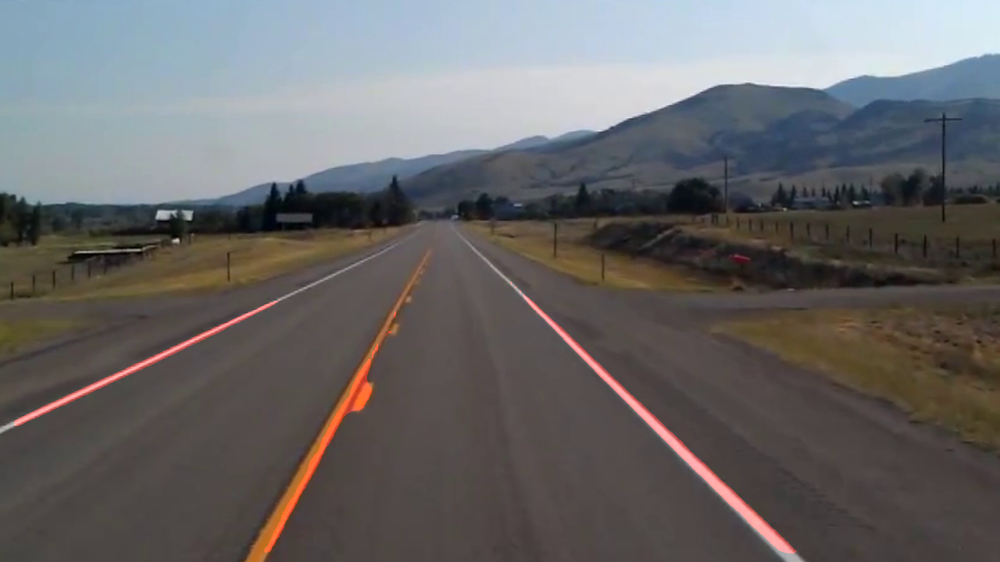

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


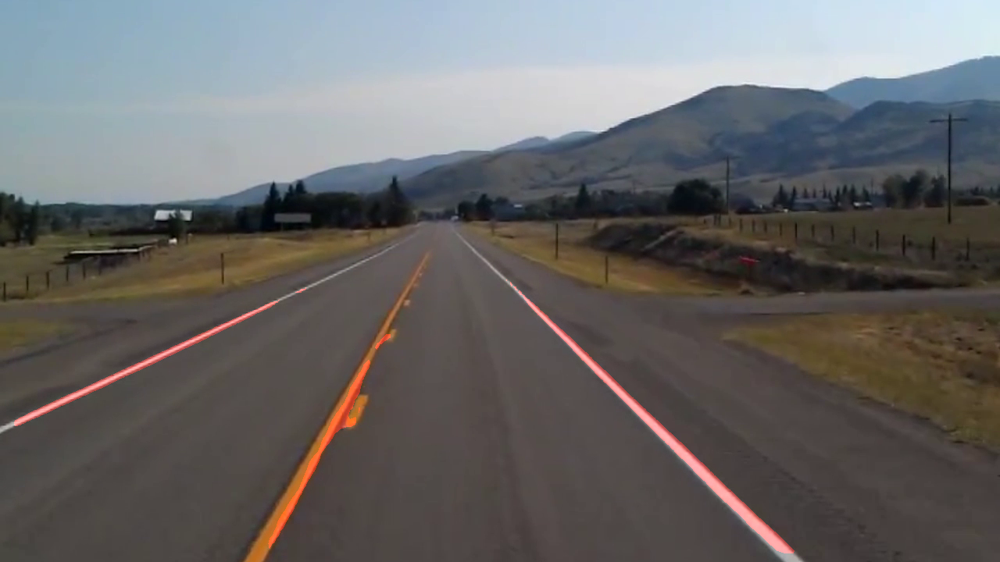

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


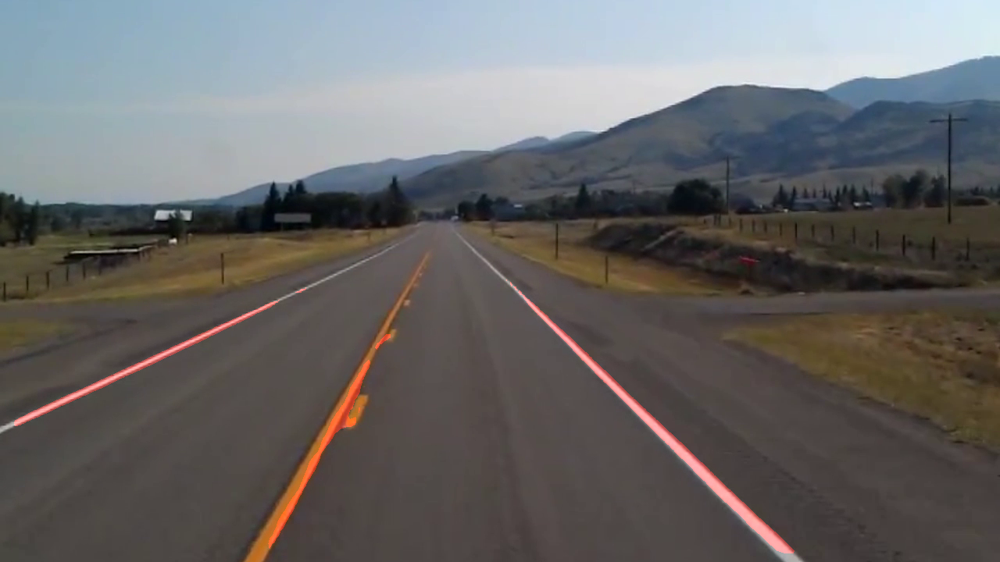

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


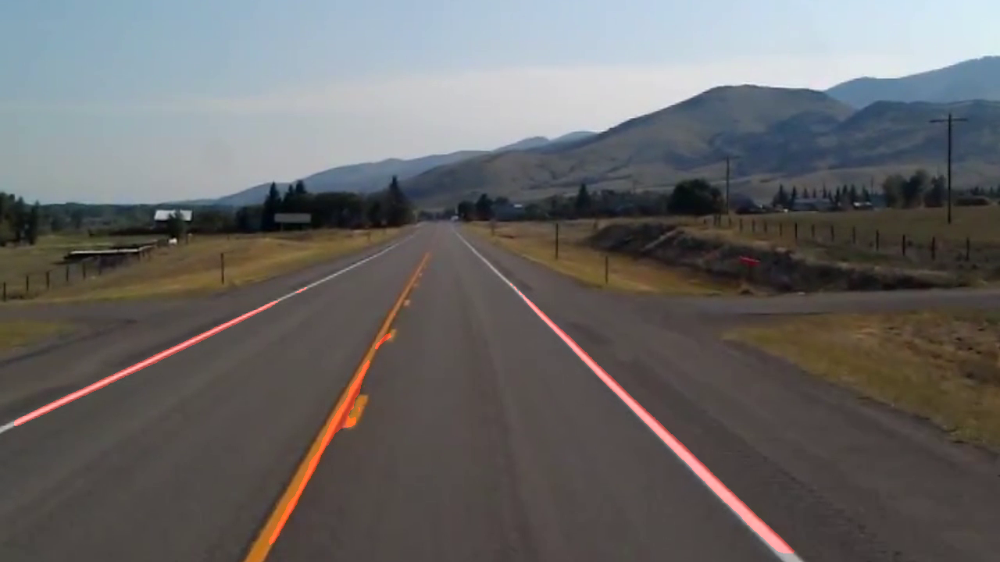

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


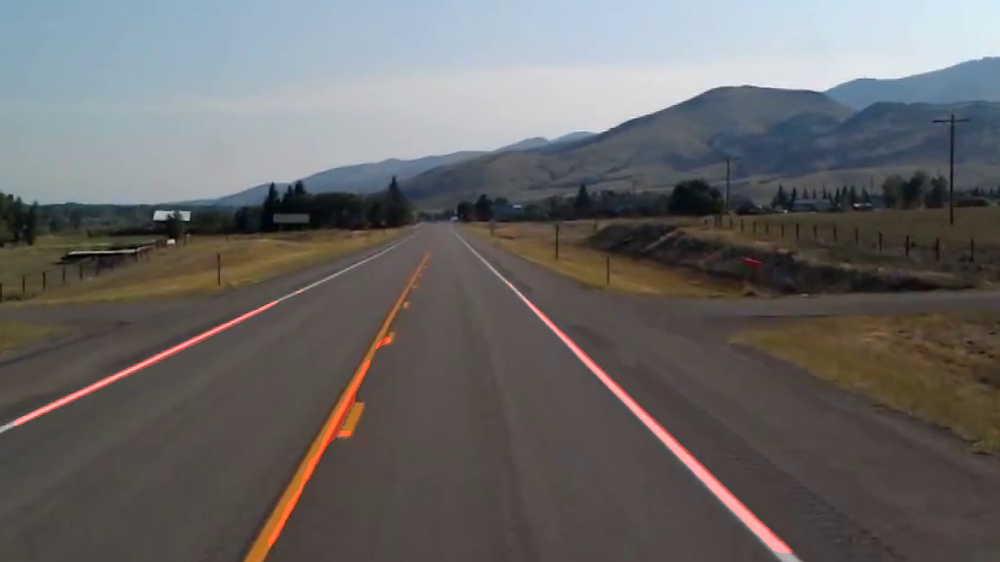

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


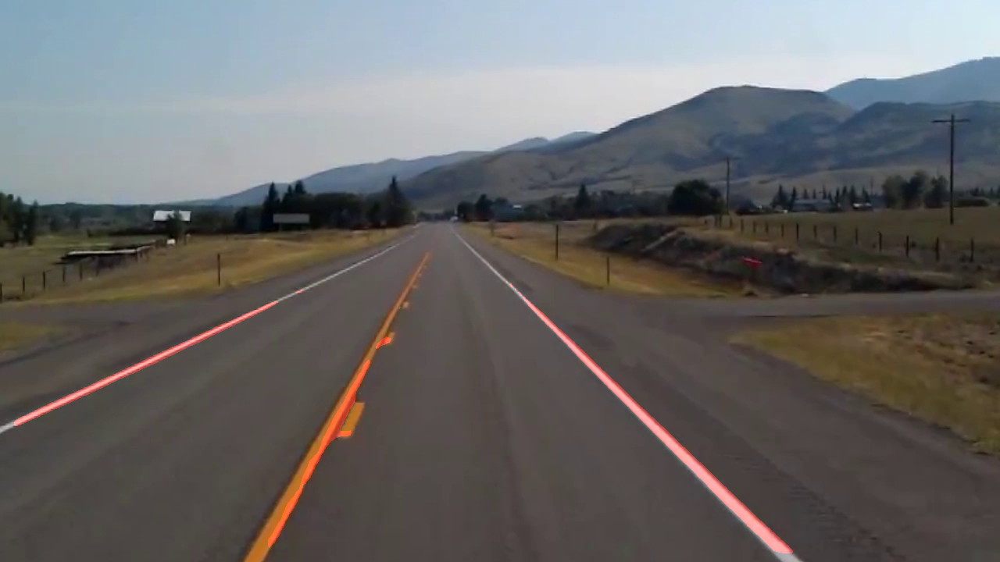

KeyboardInterrupt: 

In [26]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
cap = cv2.VideoCapture("/content/vid.mp4")

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    img = preprocess_image(frame)
    img = img.reshape(1, 224, 224, 3)
    pred_img = model.predict(img)

    pred_img = pred_img[0, :, :, 0] * 255  # Assume model outputs single-channel prediction
    pred_img = cv2.resize(pred_img, (frame.shape[1], frame.shape[0]))  # Resize to match frame

    _, mask = cv2.threshold(pred_img.astype(np.uint8), 75, 200, cv2.THRESH_BINARY)

    # Prepare the red overlay
    red_overlay = np.zeros_like(frame)
    red_overlay[:, :, 2] = mask  # Set mask in the red channel
    highlighted = cv2.addWeighted(frame, 1, red_overlay, 0.5, 0)

    cv2_imshow(highlighted)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()
